# Исследование рынка заведений общественного питания Москвы

Инвесторы решили открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

Надо подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

Доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

### План исследования
1. [Загрузка данных и подготовка их к анализу](#preprocessing)
   - [Общая информация](#data_information)
   - [Пропуски и дубликаты](#omissions_and_duplicates)
   - [Выводы](#conclusion_preprocessing)
2. [Анализ данных](#data_analysis)
    * [Выводы](#conclusion_data_analysis) 
3. [Открытие кофейни](#opening_coffee_shop)
    * [Выводы](#conclusion_opening_coffee_shop)
4. [Выводы](#conclusion)

### Загрузка данных и подготовка их к анализу
<a id="preprocessing"></a> 

In [1]:
# имортируем библиотеки
from pathlib import Path
import re
import pandas as pd
from IPython.display import display
import matplotlib.pyplot as plt
import seaborn as sns
from plotly import graph_objects as go
import numpy as np
import plotly.express as px
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster

In [2]:
# добавим форматирование вещественных чисел и темную тему для графиков
pd.options.display.float_format = '{:.2f}'.format
plt.style.use('classic')
pd.options.display.max_colwidth = 400

In [3]:
# откроем табл
try:
    data = pd.read_csv(Path.cwd() /'datasets'/'moscow_places.csv')
except:
    print('не удалось открыть файл')

#### Общая информация
<a id="data_information"></a> 

In [4]:
def general_check(df):
    display(df.head(10))
    print('Исходная инфориация /n')
    df.info()
    print()
    print(f'Размерность {df.shape}', end='/n')
    print('После переименования столбцов/n')
    df.columns = [re.sub( '(?<!^)(?=[A-Z])', '_', col ).lower() for col in df.columns]
    df.columns = [re.sub( '_i_d_', '_id_', col ).lower() for col in df.columns]
    df.info()

In [5]:
# посмотрим общ. инф. о табл.: первые 10 строк, инфо, переименуем столбцы, инфо
general_check(data)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,1550.00,NaN,0,4.00
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,1000.00,NaN,0,45.00
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,1,148.00
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.89,37.51,4.60,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.89,37.52,4.40,средние,Средний счёт:199 ₽,199.00,NaN,0,45.00
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00–22:00",55.89,37.52,4.70,средние,Средний счёт:200–300 ₽,250.00,NaN,0,45.00
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.54,4.80,средние,Средний счёт:от 500 ₽,500.00,NaN,0,79.00
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.88,37.52,4.30,средние,Средний счёт:1000–1200 ₽,1100.00,NaN,0,65.00


Исходная инфориация /n
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB

Размерность (8406, 14)/nПосле переиме

Структура данных
 - name — название заведения;
 - address — адрес заведения;
 - category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
 - hours — информация о днях и часах работы;
 - lat — широта географической точки, в которой находится заведение;
 - lng — долгота географической точки, в которой находится заведение;
 - rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
 - price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
 - avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например: 
    - «Средний счёт: 1000–1500 ₽»; 
    - «Цена чашки капучино: 130–220 ₽»; 
    - «Цена бокала пива: 400–600 ₽». и так далее;
 - middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»: 
   - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений. 
   - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число. 
   - Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
 - middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
    - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    - Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
 - chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
   - 0 — заведение не является сетевым
   - 1 — заведение является сетевым
 - district — административный район, в котором находится заведение, например Центральный административный округ;
 - seats — количество посадочных мест.

In [6]:
# посмотрим все ли заведения находятся в Москве, найдем минимальные и максимальные значения широты и долготы 
data[['lat', 'lng']].agg(['max', 'min'])

,lat,lng
max,55.93,37.87
min,55.57,37.36


In [7]:
data[['seats', 'rating']].agg(['max', 'min'])

,seats,rating
max,1288.00,5.00
min,0.00,1.00


In [8]:
# посмотрим анаомалия ли кол-во мест 0
data.query('seats == 0').head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
84,Meat Doner Kebab,булочная,"Москва, улица Лескова, 22",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.90,37.61,4.50,NaN,Средний счёт:300 ₽,300.00,NaN,0,0.00
177,Арамье,булочная,"Москва, улица 800-летия Москвы, 22, корп. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.88,37.56,4.00,NaN,NaN,NaN,NaN,1,0.00
196,Донер-Шашлык,ресторан,"Москва, улица Лескова, 22",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.90,37.61,4.50,NaN,NaN,NaN,NaN,0,0.00
203,Тандыр № 1,кафе,"Москва, улица Лескова, 22Г",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.90,37.61,4.00,NaN,NaN,NaN,NaN,1,0.00
211,Неаполитан пицца,кафе,"Москва, улица Пришвина, 23",Северо-Восточный административный округ,"ежедневно, 12:00–23:00",55.89,37.60,4.30,NaN,NaN,NaN,NaN,0,0.00
266,Пекарня&Донер,булочная,"Москва, Широкая улица, 21",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.89,37.67,4.10,NaN,NaN,NaN,NaN,0,0.00
284,Центр Плов,кафе,"Москва, Широкая улица, 16А",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.89,37.66,4.20,NaN,NaN,NaN,NaN,0,0.00
290,Шаурма,кафе,"Москва, Осташковская улица, 7, корп. 1",Северо-Восточный административный округ,NaN,55.88,37.68,3.30,NaN,NaN,NaN,NaN,0,0.00
306,Everest Coffee,кофейня,"Москва, Сходненская улица, 50",Северо-Западный административный округ,"пн-чт 08:00–22:00; пт 08:00–23:00; сб,вс 09:00–23:00",55.85,37.44,4.90,средние,Цена чашки капучино:200–300 ₽,NaN,250.00,0,0.00
337,Пекарня Маковка,пиццерия,"Москва, Сходненская улица, 35, корп. 1",Северо-Западный административный округ,"ежедневно, 08:00–22:00",55.85,37.44,4.90,NaN,NaN,NaN,NaN,0,0.00


В заведении может не быть посадочных мест, т.к. это заведение с едой на вынос, поэтому не считаем это аномалиями. 

In [9]:
data['category'].unique().tolist()

['кафе',
 'ресторан',
 'кофейня',
 'пиццерия',
 'бар,паб',
 'быстрое питание',
 'булочная',
 'столовая']

In [10]:
data['price'].unique().tolist()

[nan, 'выше среднего', 'средние', 'высокие', 'низкие']

#### Пропуски и дубликаты
<a id="omissions_and_duplicates"></a> 

In [11]:
def general_check_skipping_duplicates(df):
    print('Пропуски в столбцах')
    skipping = pd.DataFrame(
        (df.isna().sum())
        .to_frame()
        .rename(columns = {0:'space'})
        .sort_values(by = 'space', ascending = True)
    ).style.background_gradient('coolwarm')
    display(skipping)
    
    sh_original = df.shape[0]
    df.duplicated().sum()
    if df.duplicated().sum() > 0:
        df = df.drop_duplicates().reset_index(drop = True)
        sh_filter = df.shape
        delta_df = sh_original - sh_filter[0]
        print(f'Удалили {delta_df} явных дубликатов. Размерность стала {sh_filter}')
    else:
        print('Явных дубликатов нет')

In [12]:
# посмотрим пропуски и явные дубликаты
general_check_skipping_duplicates(data)

Пропуски в столбцах


,space
name,0
category,0
address,0
district,0
lat,0
lng,0
rating,0
chain,0
hours,536
seats,3611


Явных дубликатов нет


У нас есть пропуски в столбцах:
 - hours - информация о днях и часах работы,
 - seats - количество посадочных мест,
 - avg_bill -  строка, которая хранит среднюю стоимость заказа в виде диапазона,
 - price - категория цен в заведении,
 - middle_avg_bill - число с оценкой среднего чека,
 - middle_coffee_cup - число с оценкой одной чашки капучино.

In [13]:
data.query('seats != seats').head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.89,37.51,4.60,средние,NaN,NaN,NaN,0,NaN
11,Шашлык Шефф,кафе,"Москва, улица Маршала Федоренко, 10с1",Северный административный округ,"ежедневно, 10:00–21:00",55.88,37.49,4.90,NaN,NaN,NaN,NaN,0,NaN
12,Заправка,кафе,"Москва, МКАД, 80-й километр, 1",Северный административный округ,вт-сб 09:00–18:00,55.90,37.52,4.30,средние,Средний счёт:330 ₽,330.00,NaN,0,NaN


In [14]:
data['hours'] = data['hours'].fillna('Нет информации')
data['price'] = data['price'].fillna('Нет информации')

In [15]:
def check_lower_duplicate(df, col=None):
    data_lower = df.copy()
    str_columns = df.select_dtypes(exclude=[np.number]).columns.tolist()
    data_lower[str_columns] = data_lower[str_columns].apply(lambda x: x.str.lower())
    return data_lower.duplicated(col).sum()

In [16]:
check_lower_duplicate(data)

0

In [17]:
check_lower_duplicate(data, ['address', 'name'])

4

В датасете есть 4 неявных дубликата с одинаоквым адресом и названием. Удалим их.

In [18]:
data = data.drop_duplicates(subset=['address', 'name'])
check_lower_duplicate(data, ['address', 'name'])

4

In [19]:
data['name'] = data['name'].str.title()

In [20]:
def get_street(addr):
    street = re.findall(
        r'((?: [Уу]л\.|[Уу]лица|[Пп]роспект|[Пп]роезд|[Пп]ереулок|[Шш]оссе|[Бб]ульвар)(?: [-0-9a-zA-Zа-яА-ЯёЁ]+){1,2}|(?:[-0-9a-zA-Zа-яА-ЯёЁ]+ ){1,2}(?:[Уу]л\.|[Уу]лица|[Пп]роспект|[Пп]роезд|[Пп]ереулок|[Шш]оссе|[Бб]ульвар))', 
        addr
    )
    if street:
        return street[0]
    else:
        addr = re.sub(r'Москва,?', '', addr)
        addr = re.sub(r'[-0-9a-zA-Zа-яА-ЯёЁ]+ административный округ,?', '', addr)
        return addr.split(',')[0]

In [21]:
data['street'] = data['address'].apply(get_street)

In [22]:
#  есть ли строки с пустыми улицами
data['street'].isna().sum()

0

In [23]:
data[['address', 'street']]

,address,street
0,"Москва, улица Дыбенко, 7/1",улица Дыбенко
1,"Москва, улица Дыбенко, 36, корп. 1",улица Дыбенко
2,"Москва, Клязьминская улица, 15",Клязьминская улица
3,"Москва, улица Маршала Федоренко, 12",улица Маршала Федоренко
4,"Москва, Правобережная улица, 1Б",Правобережная улица
...,...,...
8401,"Москва, Профсоюзная улица, 56",Профсоюзная улица
8402,"Москва, Пролетарский проспект, 19, корп. 1",Пролетарский проспект
8403,"Москва, Люблинская улица, 112А, стр. 1",Люблинская улица
8404,"Москва, Люблинская улица, 112А, стр. 1",Люблинская улица


In [24]:
data['is_24_7'] = data['hours'].apply(lambda x: 'круглосуточно' in x or 'ежедневно' in x)

In [25]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8406 entries, 0 to 8405
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              8406 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              8406 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
 14  street             8406 non-null   object 
 15  is_24_7            8406 non-null   bool   
dtypes: bool(1), float64(6), 

In [26]:
# посмотрим сколько пропусков осталось
general_check_skipping_duplicates(data)

Пропуски в столбцах


,space
name,0
category,0
address,0
district,0
hours,0
lat,0
lng,0
rating,0
price,0
chain,0


Явных дубликатов нет


#### Выводы
<a id="conclusion_preprocessing"></a> 

 Мы:
 - Заметили, что в данных нет явных дубликатов;
 - Удалили неявные дубликаты;
 - Создали столбцы с улицей и проверкой круглосуточной работы;
 - Заметили, что в данных есть пустые строки в столбцах:
     - hours,
     - seats,
     - avg_bill,
     - price,
     - middle_avg_bill,
     - middle_coffee_cup
 - Заменили пустые строки в столбцах:
     - hours на Нет информации,
     - price на Нет информации.

### Анализ данных
<a id="data_analysis"></a> 

Какие категории заведений представлены в данных? Исследуйте количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее.

In [27]:
def data_group(df, par, agg_par, agg_col):
    data_gr = (
        df
       .groupby(by = par)
       .agg(agg_par)
    )
    data_gr.columns = agg_col
    return data_gr.sort_values(by = agg_col[0], ascending=False).reset_index()

In [28]:
data_category = data_group(data, 'category', {'name': 'count'}, ['cnt'])
data_category

,category,cnt
0,кафе,2378
1,ресторан,2043
2,кофейня,1413
3,"бар,паб",765
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


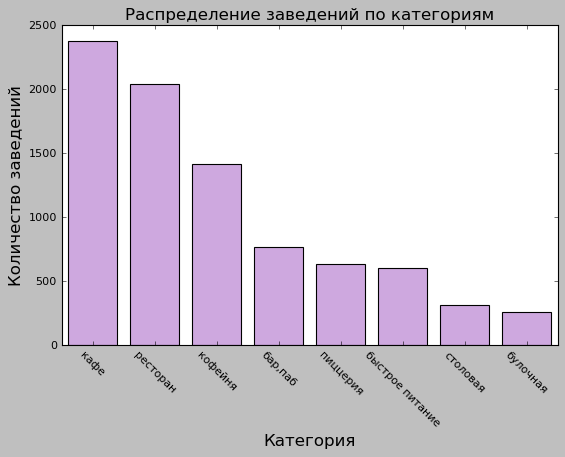

In [29]:

plt.figure(figsize=(8, 5))
sns.barplot(x='category', y='cnt', data=data_category, color='#d19fe8')
plt.title('Распределение заведений по категориям', fontsize=15)
plt.xlabel('Категория', fontsize=15)
plt.xticks(rotation=-45)
plt.ylabel('Количество заведений', fontsize=15)
plt.tick_params (axis='both', which='major', labelsize=10)
plt.show()

В датасете представлены:
  - кафе - 2378
  - ресторан - 2043
  - кофейня - 1413
  - бар, паб - 765
  - пиццерия - 633
  - быстрое питание - 603
  - столовая - 315
  - булочная - 256
  
Больше всего кафе, ресторанов и кофеен, а меньше всего столовых и булочных. 

Исследуйте количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее.

In [30]:
data_seats = data_group(data, 'category', {'seats': ['median', 'mean', 'max', 'min']}, 
                        ['median_seats', 'mean_seats', 'max_seats', 'min_seats'])
data_seats

,category,median_seats,mean_seats,max_seats,min_seats
0,ресторан,86.00,121.94,1288.00,0.00
1,"бар,паб",82.50,124.53,1288.00,0.00
2,кофейня,80.00,111.20,1288.00,0.00
3,столовая,75.50,99.75,1200.00,0.00
4,быстрое питание,65.00,98.89,1040.00,0.00
5,кафе,60.00,97.51,1288.00,0.00
6,пиццерия,55.00,94.50,1288.00,0.00
7,булочная,50.00,89.39,625.00,0.00


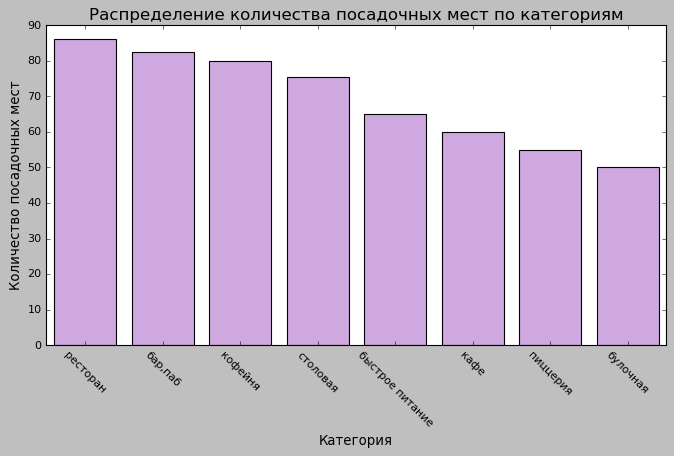

In [31]:
plt.figure(figsize=(10, 5))
sns.barplot(x='category', y='median_seats', data=data_seats, color='#d19fe8')
plt.title('Распределение количества посадочных мест по категориям', fontsize=15)
plt.xlabel('Категория', fontsize=12)
plt.xticks(rotation=-45)
plt.ylabel('Количество посадочных мест', fontsize=12)
plt.tick_params(axis='both', which='major', labelsize=10)
plt.show()

У кол-ва посадочных мест большой разброс между максимальным и минимыльным кол-вом мест, поэтому будем использовать медианное значение для орпеделение среднего.

Больше всего посадочных мест в ресторанох, бар/пабах и кофейнях. Меньше всего в кафе, пиццериях и булочных.

Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?

In [32]:
data_chain = data_group(data, 'chain', {'name': 'count'}, ['count_chain'])
data_chain['chain'] = data_chain['chain'].map({0: 'не сеть', 1: 'сеть'})
data_chain['share'] = data_chain['count_chain']/data['name'].shape[0] * 100
data_chain = data_chain.set_index('chain')
data_chain

,count_chain,share
chain,,
не сеть,5201,61.87
сеть,3205,38.13


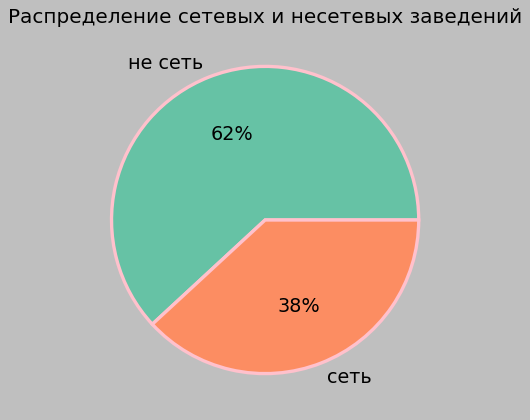

In [33]:
colors = sns.color_palette('Set2')
data_chain.plot(kind='pie',
                y="share",
                autopct='%1.0f%%',
                wedgeprops={'linewidth': 3.0, 'edgecolor': '#ffc1cc'},
                textprops={'size': 'x-large'}, 
                colors=colors,
                legend=False, 
               ).set(ylabel='')
plt.title('Распределение сетевых и несетевых заведений', fontsize=18)
plt.show()

В датасете 62% не сетевых заведений и 38% сетевых заведений.

Какие категории заведений чаще являются сетевыми?

In [34]:
data_chain_category = data_group(data, ['category', 'chain'], {'name': 'count'}, ['count_chain'])
data_chain_category = data_chain_category.merge(data_category, how='inner', on='category')
data_chain_category['chain'] = data_chain_category['chain'].map({0: 'не сеть', 1: 'сеть'})

data_chain_category['share_in_category'] = data_chain_category['count_chain']/data_chain_category['cnt'] * 100

data_chain_category['share_of_category'] = data_chain_category.apply(
    lambda row: row['count_chain']/data_chain['count_chain']['сеть'] * 100
    if row['chain'] == 'сеть' else row['count_chain']/data_chain['count_chain']['не сеть'] * 100,
    axis=1
)

data_chain_category

,category,chain,count_chain,cnt,share_in_category,share_of_category
0,кафе,не сеть,1599,2378,67.24,30.74
1,кафе,сеть,779,2378,32.76,24.31
2,ресторан,не сеть,1313,2043,64.27,25.25
3,ресторан,сеть,730,2043,35.73,22.78
4,кофейня,сеть,720,1413,50.96,22.46
5,кофейня,не сеть,693,1413,49.04,13.32
6,"бар,паб",не сеть,596,765,77.91,11.46
7,"бар,паб",сеть,169,765,22.09,5.27
8,быстрое питание,не сеть,371,603,61.53,7.13
9,быстрое питание,сеть,232,603,38.47,7.24


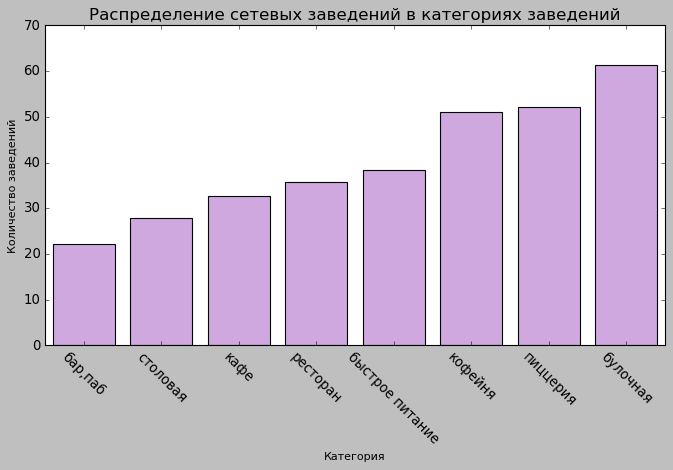

In [35]:
plt.figure(figsize=(10, 5)) 
plt.tick_params(axis='both', which='major', labelsize=12)
sns.barplot(x='category', 
            y='share_in_category', 
            data=data_chain_category.query('chain == "сеть"').sort_values(by='share_in_category'),
            color='#d19fe8'
           )

plt.title('Распределение сетевых заведений в категориях заведений', fontsize=15)
plt.xlabel('Категория', fontsize=10)
plt.xticks(rotation=-45)
plt.ylabel('Количество заведений', fontsize=10)

plt.show()

Больше всего сетевых заведений в категории булочных, пиццерий и кафеен. Меньше всего в категориях бар/пабах, столовых и кафе.

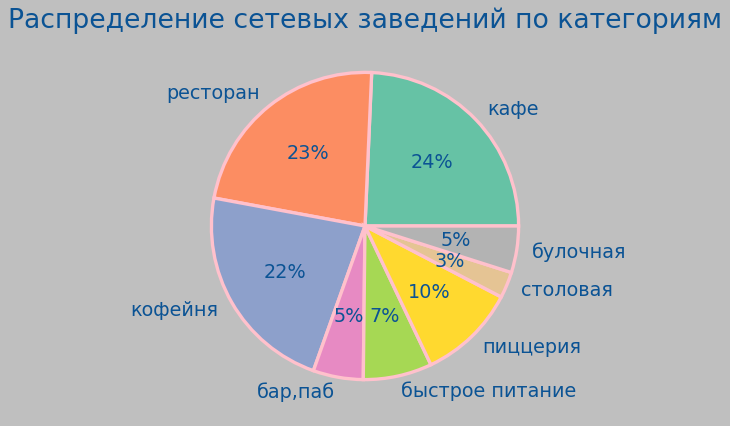

In [36]:
plt.style.use('bmh')
(
    data_chain_category
    .query('chain == "сеть"')
    .set_index('category')
    .plot(kind='pie',
          y="share_of_category",
          autopct='%1.0f%%',
          wedgeprops={'linewidth': 3.0, 'edgecolor': '#ffc1cc'},
          textprops={'size': 'x-large', 'color':"#0b5394"}, 
          colors=colors,
          legend=False,
          style='Solarize_Light2'
          )
    .set(ylabel='')
)
plt.title('Распределение сетевых заведений по категориям', fontsize=24, color='#0b5394')

plt.show()

Среди всех заведений сетевых больше всего кафе, ресторанов и кафеен. Меньше всего булочных, бар/пабов и столовых.

Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся?

In [37]:
data_top = data_group(data.query('chain == 1'), ['name', 'category'], {'name': 'count'}, ['cnt'])
data_top_15 = data_top.head(15)
data_top_15

,name,category,cnt
0,Шоколадница,кофейня,119
1,Домино'С Пицца,пиццерия,76
2,Додо Пицца,пиццерия,74
3,One Price Coffee,кофейня,71
4,Яндекс Лавка,ресторан,69
5,Cofix,кофейня,65
6,Prime,ресторан,49
7,Кофепорт,кофейня,42
8,Кулинарная Лавка Братьев Караваевых,кафе,39
9,Теремок,ресторан,36


Яндекс Лавка не заведение общественного питания, поэтому исключим его из топ 15 заведений.

In [38]:
not_chain = ['Яндекс Лавка']
data_top_15 = data_top.query('name not in @not_chain').head(15).reset_index(drop = True)
data_top_15

,name,category,cnt
0,Шоколадница,кофейня,119
1,Домино'С Пицца,пиццерия,76
2,Додо Пицца,пиццерия,74
3,One Price Coffee,кофейня,71
4,Cofix,кофейня,65
5,Prime,ресторан,49
6,Кофепорт,кофейня,42
7,Кулинарная Лавка Братьев Караваевых,кафе,39
8,Теремок,ресторан,36
9,Cofefest,кофейня,31


In [39]:
data_group(data_top_15, 'category', {'name': 'count'}, ['cnt'])

,category,cnt
0,кофейня,6
1,кафе,3
2,пиццерия,2
3,ресторан,2
4,булочная,1
5,быстрое питание,1


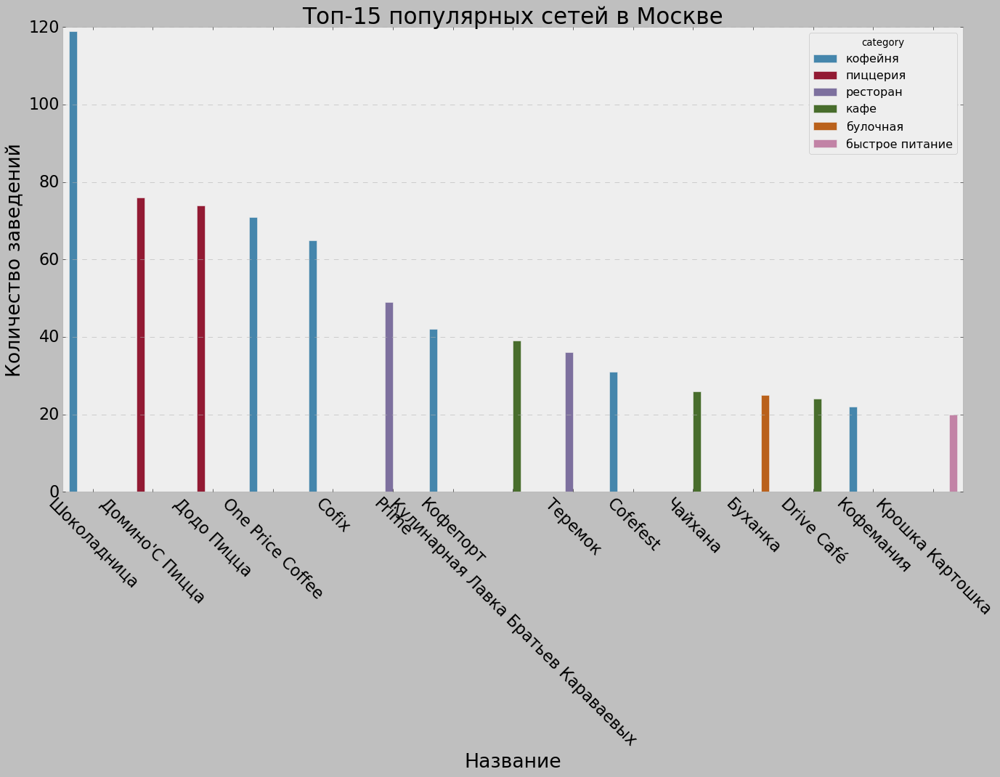

In [40]:
plt.figure(figsize=(20, 10))
sns.barplot(x='name', y='cnt', data=data_top_15, hue='category')
plt.title('Топ-15 популярных сетей в Москве', fontsize=28)
plt.xlabel('Название', fontsize=24)
plt.xticks(rotation=-45)
plt.ylabel('Количество заведений', fontsize=24)
plt.tick_params (axis='both', which='major', labelsize=20)
plt.show()

Самая популярая сеть в Москве - Шоколодница, потом Домино'С Пицца, Додо Пицца, One Price Coffee. Больше всего в топ-15 популярных сетей в Москве заведений из категории кафеен, также есть заведения из категории кафе, пиццерия, ресторан, булочная и быстрое питание.

Какие административные районы Москвы присутствуют в датасете? Отобразите общее количество заведений и количество заведений каждой категории по районам. 

In [41]:
data['district'].unique().tolist()

['Северный административный округ',
 'Северо-Восточный административный округ',
 'Северо-Западный административный округ',
 'Западный административный округ',
 'Центральный административный округ',
 'Восточный административный округ',
 'Юго-Восточный административный округ',
 'Южный административный округ',
 'Юго-Западный административный округ']

Заменим полное название районов на аббревиатуру.

In [42]:
data['district_reduction'] = data['district'].replace({
     'Северный административный округ': 'САО',
     'Северо-Восточный административный округ': 'СВАО',
     'Северо-Западный административный округ': 'СЗАО',
     'Западный административный округ': 'ЗАО',
     'Центральный административный округ': 'ЦАО',
     'Восточный административный округ': 'ВАО',
     'Юго-Восточный административный округ': 'ЮВАО',
     'Южный административный округ': 'ЮАО',
     'Юго-Западный административный округ': 'ЮЗАО'
})

In [43]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7,district_reduction
0,Wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,Нет информации,NaN,NaN,NaN,0,NaN,улица Дыбенко,True,САО
1,Четыре Комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,1550.00,NaN,0,4.00,улица Дыбенко,True,САО
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,1000.00,NaN,0,45.00,Клязьминская улица,False,САО
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,Нет информации,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN,улица Маршала Федоренко,True,САО
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,1,148.00,Правобережная улица,True,САО


In [44]:
data_district_category = data_group(data, ['district_reduction', 'category'], {'name': 'count'}, ['cnt'])
data_district_cnt = data_group(data, 'district_reduction', {'name': 'count'}, ['cnt_in_district'])
data_district_category = (data_district_category
                          .merge(data_district_cnt, how='inner', on='district_reduction')
                          .sort_values(by='cnt_in_district')
                         )
data_district_category

,district_reduction,category,cnt,cnt_in_district
71,СЗАО,булочная,12,409
69,СЗАО,"бар,паб",23,409
68,СЗАО,быстрое питание,30,409
67,СЗАО,пиццерия,40,409
66,СЗАО,кофейня,62,409
...,...,...,...,...
4,ЦАО,пиццерия,113,2242
3,ЦАО,"бар,паб",364,2242
2,ЦАО,кофейня,428,2242
1,ЦАО,кафе,464,2242


In [45]:
def graph (df, dist, axes):
    categ = df[dist].sort_values(ascending=False)
    colors = sns.color_palette("deep", 9)
    categ.plot(kind='pie',
               y="category",
               autopct='%1.0f%%',
               wedgeprops={'linewidth': 3.0, 'edgecolor': 'white'},
               textprops={'fontsize': 100}, 
               colors=colors,
               legend=False,
               ax = axes).set(ylabel='')
    axes.set_title(f"Заведения в {dist}", fontsize=110, pad=40, color='#b967ff')
    plt.tight_layout()

In [46]:
fig, axes = plt.subplots(5, 2, figsize = (80,130))

fig.suptitle('Распределение категорий заведений по округам', fontsize=140, fontweight='bold')
data_category_district = data.pivot_table(index='category', 
                                         columns='district_reduction',
                                         values='name',
                                         aggfunc='count').reset_index()
data_category_district = data_category_district.set_index('category')
graph(data_category_district,'САО', axes[0][0])
graph(data_category_district,'СВАО', axes[0][1])
graph(data_category_district,'СЗАО', axes[1][0])
graph(data_category_district,'ЗАО', axes[1][1])
graph(data_category_district,'ЦАО', axes[2][0])
graph(data_category_district,'ВАО', axes[2][1])
graph(data_category_district,'ЮВАО', axes[3][0])
graph(data_category_district,'ЮЗАО', axes[3][1])
graph(data_category_district,'ЮАО', axes[4][0])

fig.tight_layout(h_pad=25, pad=25.0)
plt.show()

В большинстве округов преобладают кафе, в центральном административном округе преобладают рестораны. Во всех округах самыми популярными категориями являются кафе, ресторан и кофейня, а самыми непопулярными булочная и столовая.

In [47]:
fig = px.bar(data_district_category, y="district_reduction", x='cnt', 
             color='category', title='Количество заведений каждой категории по районам', 
             labels=dict(category="Категория", cnt="Количество", district_reduction="Округ")
)
fig.show()

Больше всего заведений в центральном районе, в северном, юго-восточном и северо-восточном районах примерно одинаково. Меньше всего заведений в северо-западном округе.

Визуализируйте распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?

In [48]:
data_rating = data_group(data, 'category', {'rating': 'mean'}, ['mean_rating'])
data_rating

,category,mean_rating
0,"бар,паб",4.39
1,пиццерия,4.30
2,ресторан,4.29
3,кофейня,4.28
4,булочная,4.27
5,столовая,4.21
6,кафе,4.12
7,быстрое питание,4.05


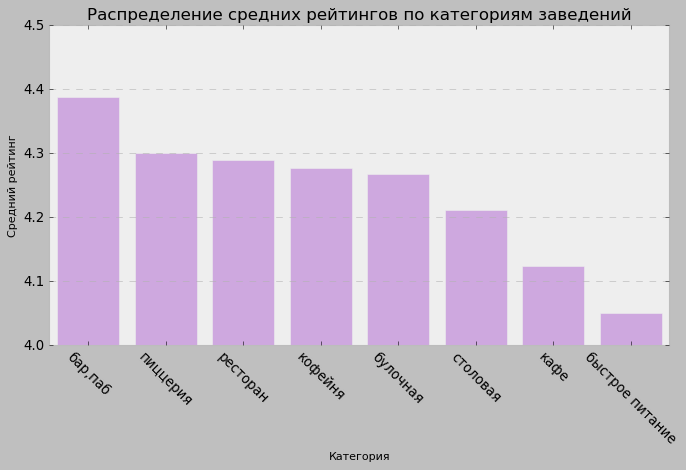

In [49]:
plt.figure(figsize=(10, 5)) 
plt.tick_params(axis='both', which='major', labelsize=12)
g = sns.barplot(x='category', 
                y='mean_rating', 
                data=data_rating,
                color='#d19fe8',
               )
g.set_ylim(4, 4.5)
plt.title('Распределение средних рейтингов по категориям заведений', fontsize=15)
plt.xlabel('Категория', fontsize=10)
plt.xticks(rotation=-45)
plt.ylabel('Средний рейтинг', fontsize=10)

plt.show()

In [50]:
data.agg({'rating':['max', 'min']})

,rating
max,5.00
min,1.00


In [51]:
data_rating_5 = data.query('rating == 5.00')
cnt_rating_5 = data_rating_5['name'].count()
data_rating_1 = data.query('rating == 1.00')
cnt_rating_1 = data_rating_1['name'].count()
print(f'Среди всех заведений всего у {cnt_rating_5} заведений рейтинг 5.00, а у {cnt_rating_1} заведений рейтинг 1.00')

Среди всех заведений всего у 105 заведений рейтинг 5.00, а у 10 заведений рейтинг 1.00


 Средний рейтинг заведений в разных типах общепита примерно одинаковый от 4.39 в бар, пабах до 4.05 в быстром питании. Среди всех заведений всего у 105 заведений рейтинг 5.00, а у 10 заведений рейтинг 1.00.

Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson.


In [52]:
try:
    with open(Path.cwd() /'datasets'/'admin_level_geomap.geojson', encoding='utf-8') as f:
        gj = json.load(f)
except:
    print('не удалось открыть файл')

In [53]:
data_rating_district = data_group(data, 'district', {'rating': 'mean'}, ['rating'])
data_rating_district

,district,rating
0,Центральный административный округ,4.38
1,Северный административный округ,4.24
2,Северо-Западный административный округ,4.21
3,Южный административный округ,4.18
4,Западный административный округ,4.18
5,Восточный административный округ,4.17
6,Юго-Западный административный округ,4.17
7,Северо-Восточный административный округ,4.15
8,Юго-Восточный административный округ,4.10


In [54]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=gj,
    data=data_rating_district,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Во всех округах средний рейтинг также примерно одинаковый от 4.38 в цетральном до 4.1 в юго-восточном.

Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки folium.


In [55]:
# функция, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

In [56]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

Найдите топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам.

In [57]:
street_top = data_group(data, 'street', {'name': 'count'}, ['cnt_on_street'])
street_top15 = street_top.head(15)
street_top15

,street,cnt_on_street
0,проспект Мира,184
1,Профсоюзная улица,122
2,Ленинский проспект,108
3,проспект Вернадского,108
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,76
8,Ленинградское шоссе,70
9,МКАД,65


In [58]:
streets = street_top15["street"].tolist()
data_street_top15 = data.query('street in @streets')
data_street_category_top15 = data_group(data_street_top15, ['street', 'category'], {'name': 'count'}, ['cnt'])
data_street_category_top15 = data_street_category_top15.merge(street_top15, how='inner', on='street').sort_values(
    by=['cnt_on_street', 'cnt'], ascending=False)
data_street_category_top15

,street,category,cnt,cnt_on_street
0,проспект Мира,кафе,53,184
1,проспект Мира,ресторан,45,184
2,проспект Мира,кофейня,36,184
3,проспект Мира,быстрое питание,21,184
4,проспект Мира,"бар,паб",12,184
...,...,...,...,...
91,Пятницкая улица,кафе,7,48
92,Пятницкая улица,кофейня,6,48
93,Пятницкая улица,пиццерия,3,48
94,Пятницкая улица,булочная,3,48


In [59]:
fig = px.bar(data_street_category_top15, y="street", x='cnt', 
             color='category', 
             title='Количество заведений каждой категории на топ 15 улицах', 
             labels=dict(category="Категория", cnt="Количество", district_reduction="Округ")
)
fig.show()

На проспекте Мира больше всего заведений, на этой улице больше всего кафе и ресторанов. На втором месте Профсоюзная улица на ней также больше всего кафе и ресторанов. На Ленинском проспекте и проспекте Вернадского больше ресторанов, а на вторм месте кафе.

Найдите улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?

In [60]:
street_one_object = street_top.query('cnt_on_street == 1').reset_index(drop=True)
street_one_object

,street,cnt_on_street
0,улица Вучетича,1
1,ландшафтный заказник Лианозовский,1
2,улица Мусоргского,1
3,улица Высоцкого,1
4,Сытинский тупик,1
...,...,...
465,16-я Парковая улица,1
466,14-я Парковая улица,1
467,12-я Парковая улица,1
468,Старокаширское шоссе,1


In [61]:
streets = street_one_object["street"].tolist()
data_street_category_one_object = data.query('street in @streets')
data_street_category_one_object = data_group(data_street_category_one_object, ['category'], {'name': 'count'}, ['cnt'])
data_street_category_one_object

,category,cnt
0,кафе,165
1,ресторан,92
2,кофейня,87
3,"бар,паб",42
4,столовая,36
5,быстрое питание,23
6,пиццерия,15
7,булочная,10


В датасете 470 улиц с одним заведением. Среди  них заведения категорий кафе, рестораны, кофейни, бар/пабы, столовые, быстрое питание, пиццерии и булочные.

Посчитайте медиану средних чеков заведений для каждого района. Используйте это значение в качестве ценового индикатора района. Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируйте цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?

In [62]:
data_district_bill = data_group(data, 'district_reduction', 
                                {'middle_avg_bill': 'median'}, ['median_middle_avg_bill']
                               )
data_district_bill

,district_reduction,median_middle_avg_bill
0,ЗАО,1000.00
1,ЦАО,1000.00
2,СЗАО,700.00
3,САО,650.00
4,ЮЗАО,600.00
5,ВАО,575.00
6,СВАО,500.00
7,ЮАО,500.00
8,ЮВАО,450.00


In [63]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=gj,
    data=data_district_bill,
    columns=['district_reduction', 'median_middle_avg_bill'],
    key_on='feature.properties.ref',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Значение среднего чека заведений по районам',
).add_to(m)

# выводим карту
m

В центральном и западном округах самый дорогой средний чек, самый дешевый средний чек в северо-восточном, южном и юго-восточном округах.

#### Выводы
<a id="conclusion_data_analysis"></a>

В датасете представлены:
 - кафе - 2378
 - ресторан - 2043
 - кофейня - 1413
 - бар, паб - 765
 - пиццерия - 633
 - быстрое питание - 603
 - столовая - 315
 - булочная - 256
Больше всего кафе, ресторанов и кофеен, а меньше всего столовых и булочных.

Больше всего посадочных мест в ресторанох, бар/пабах и кофейнях. Меньше всего в кафе, пиццериях и булочных.

В датасете 62% не сетевых заведений и 38% сетевых заведений.
Больше всего сетевых заведений в категории булочных, пиццерий и кафеен. Меньше всего в категориях бар/пабах, столовых и кафе.
Среди всех заведений сетевых больше всего кафе, ресторанов и кафеен. Меньше всего булочных, бар/пабов и столовых.

Больше всего в топ-15 популярных сетей в Москве заведений из категории кафеен, также есть заведения из категории кафе, пиццерия, ресторан, булочная и быстрое питание. Самая популярая сеть в Москве - Шоколодница, потом Домино'С Пицца, Додо Пицца, One Price Coffee.

В большинстве округов преобладают кафе, в центральном административном округе преобладают рестораны. Во всех округах самыми популярными категориями являются кафе, ресторан и кафейня, а самыми непопулярными булочная и столовая.
Больше всего заведений в центральном районе, в северном, юго-восточном и северо-восточном районах примерно одинаково. Меньше всего заведений в северо-западном округе.

Средний рейтинг заведений в разных типах общепита примерно одинаковый от 4.39 в бар, пабах до 4.05 в быстром питании.  Среди всех заведений всего у 105 заведений рейтинг 5.00, а у 10 заведений рейтинг 1.00.

На проспекте Мира больше всего заведений, на этой улице больше всего кафе и ресторанов. На втором месте Профсоюзная улица на ней также больше всего кафе и ресторанов. На Ленинском проспекте и проспекте Вернадского больше ресторанов, а на вторм месте кафе.
Также есть 470 улиц с одним заведением. Среди них заведения категорий кафе, рестораны, кофейни, бар/пабы, столовые, быстрое питание, пиццерии и булочные.

### Детализируем исследование: открытие кофейни
<a id="opening_coffee_shop"></a>

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуйте определить, осуществима ли мечта клиентов.

In [64]:
# отфильтруем все заведения категории кофейня
data_coffee_house = data.query('category=="кофейня"').reset_index(drop=True)
data_coffee_house.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7,district_reduction
0,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,Нет информации,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN,улица Маршала Федоренко,True,САО
1,В Парке Вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.88,37.46,4.30,Нет информации,NaN,NaN,NaN,1,NaN,парк Левобережный,True,САО
2,9 Bar Coffee,кофейня,"Москва, Коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.89,37.51,4.00,Нет информации,NaN,NaN,NaN,1,46.00,Коровинское шоссе,False,САО
3,Cofefest,кофейня,"Москва, улица Маршала Федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.88,37.49,3.60,Нет информации,NaN,NaN,NaN,1,NaN,улица Маршала Федоренко,False,САО
4,Cofix,кофейня,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.88,37.48,3.80,Нет информации,NaN,NaN,NaN,1,NaN,улица Дыбенко,True,САО


Рассмотрим как распределены кафейни по районам.

In [65]:
cnt_coffee_house = data_coffee_house['name'].count()
print(f'Кофеен {cnt_coffee_house}')
data_coffee_house_district = data_group(data_coffee_house, 'district_reduction', 
                                        {'name': 'count'}, ['cnt_cofe']
                                       )
data_coffee_house_district

Кофеен 1413


,district_reduction,cnt_cofe
0,ЦАО,428
1,САО,193
2,СВАО,159
3,ЗАО,150
4,ЮАО,131
5,ВАО,105
6,ЮЗАО,96
7,ЮВАО,89
8,СЗАО,62


In [66]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# применяем функцию create_clusters() к каждой строке датафрейма
data_coffee_house.apply(create_clusters, axis=1)

# выводим карту
m

Больше всего кофеен в центральном районе, их почти в два раза больше, чем в других районах. Топ 3 без центрального района:
- северный, 
- северо-восточный 
- западный

Меньше всего кофеен в северо-западном районе.

In [67]:
data_coffee_house_24 = data_group(data_coffee_house, 'is_24_7', {'name': 'count'}, ['cnt_is_24_7'])
data_coffee_house_24['share'] = data_coffee_house_24['cnt_is_24_7']/cnt_coffee_house * 100
data_coffee_house_24['is_24_7'] = data_coffee_house_24['is_24_7'].map({True: 'да', False: 'нет'})
data_coffee_house_24 = data_coffee_house_24.set_index('is_24_7')
data_coffee_house_24

,cnt_is_24_7,share
is_24_7,,
нет,768,54.35
да,645,45.65


Среди кофеен 95% не работает круглосуточно и только 5% работает.

Рассмотрим средний рейтинг кофеен в зависимости от района.

In [68]:
mean_rating_cafe = data_rating.query('category == "кофейня"')['mean_rating']
print(f'Средний рейтинг кофеен {mean_rating_cafe}')
data_coffee_house_district_rating = data_group(data_coffee_house, 
                                               'district', {'rating': 'mean'}, 
                                               ['rating'])
data_coffee_house_district_rating

Средний рейтинг кофеен 3   4.28
Name: mean_rating, dtype: float64


,district,rating
0,Центральный административный округ,4.34
1,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
3,Юго-Западный административный округ,4.28
4,Восточный административный округ,4.28
5,Южный административный округ,4.23
6,Юго-Восточный административный округ,4.23
7,Северо-Восточный административный округ,4.22
8,Западный административный округ,4.20


In [69]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=gj,
    data=data_coffee_house_district_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг кофеен по районам',
).add_to(m)

# выводим карту
m

In [70]:
display(data_coffee_house.agg({'rating':['max', 'min']}))
data_rating_5 = data_coffee_house.query('rating == 5.00')
cnt_rating_5 = data_rating_5['name'].count()
data_rating_1 = data_coffee_house.query('rating < 2.00')
cnt_rating_1 = data_rating_1['name'].count()
print(f'Среди всех кафеен всего у {cnt_rating_5} заведений рейтинг 5.00, а у {cnt_rating_1} заведений рейтинг меньше 2.00')

,rating
max,5.00
min,1.40


Среди всех кафеен всего у 37 заведений рейтинг 5.00, а у 1 заведений рейтинг меньше 2.00


Примерно во всех округах рейтинг у кофеен примерно одинаковый: максимальный 4.34 в центральном округе и минимальный 4.2 в западном. Среди всех заведений всего у 37 заведений рейтинг 5.00, а у 1 заведений рейтинг меньше 2.00

Рассмотрим среднюю стоимость чашки капучино в разных районах.

In [71]:
print(f'Средняя стоимость чашки капучино {data_coffee_house["middle_coffee_cup"].mean()}')
data_coffee_house_district_coffee_cup = data_group(data_coffee_house, 'district', 
                                                   {'middle_coffee_cup': 'mean'}, 
                                                   ['mean_middle_coffee_cup'])
data_coffee_house_district_coffee_cup

Средняя стоимость чашки капучино 175.0556621880998


,district,mean_middle_coffee_cup
0,Западный административный округ,189.94
1,Центральный административный округ,187.52
2,Юго-Западный административный округ,184.18
3,Восточный административный округ,174.02
4,Северный административный округ,165.79
5,Северо-Западный административный округ,165.52
6,Северо-Восточный административный округ,165.33
7,Южный административный округ,158.49
8,Юго-Восточный административный округ,151.09


In [72]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=gj,
    data=data_coffee_house_district_coffee_cup,
    columns=['district', 'mean_middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианная стоимость чашки капучино кофеен по районам',
).add_to(m)

# выводим карту
m

Самая дорогая чашка капучино в западном, центральном и юго-западном районах, а самые дешевые в южном и юго-восточном районах.

Для рекомендации по открытию кофейни не достаточно данных. У нас нет информации по начальному капиталу, средней прибыли в районе, чтобы рассчитать окупаемость инвестиций. Лучше иметь информацию о проходимости в препологаемом месте открытия, чтобы понять будут ли клиенты. Также лучше изучить есть ли среди этих кофеен тематические (чтобы проверить оригинальность идеи).

#### Выводы
<a id="conclusion_opening_coffee_shop"></a>

Больше всего кофеен в центральном районе, их почти в два раза больше, чем в других районах. Топ 3 без центрального района:
- северный,
- северо-восточный
- западный

Меньше всего кофеен в северо-западном районе.

Среди кофеен 95% не работает круглосуточно и только 5% работает.

Примерно во всех округах рейтинг у кофеен примерно одинаковый: максимальный 4.34 в центральном округе и минимальный 4.2 в западном. Среди всех кофеен у 37 рейтинг 5.00, а у 1 рейтинг меньше 2.00

Самая дорогая чашка капучино в западном, центральном и юго-западном районах, а самые дешевые в южном и юго-восточном районах.

### Выводы
<a id="conclusion"></a> 

В датасете представлены:
 - кафе - 2378
 - ресторан - 2043
 - кофейня - 1413
 - бар, паб - 765
 - пиццерия - 633
 - быстрое питание - 603
 - столовая - 315
 - булочная - 256
Больше всего посадочных мест в ресторанох, бар/пабах и кофейнях. Меньше всего в кафе, пиццериях и булочных.

Больше всего посадочных мест в ресторанох, бар/пабах и пиццериях. Меньше всего в кофейнях, столовых и кафе.

В датасете 62% не сетевых заведений и 38% сетевых заведений.
Больше всего сетевых заведений в категории булочных, пиццерий и кафеен. Меньше всего в категориях бар/пабах, столовых и кафе.
Среди всех заведений сетевых больше всего кафе, ресторанов и кафеен. Меньше всего булочных, бар/пабов и столовых.

Больше всего в топ-15 популярных сетей в Москве заведений из категории кафеен, также есть заведения из категории кафе, пиццерия, ресторан, булочная и быстрое питание. Самая популярая сеть в Москве - Шоколодница, потом Домино'С Пицца, Додо Пицца, One Price Coffee.

В большинстве округов преобладают кафе, в центральном административном округе преобладают рестораны. Во всех округах самыми популярными категориями являются кафе, ресторан и кофейня, а самыми непопулярными булочная и столовая.
Больше всего заведений в центральном районе, в северном, юго-восточном и северо-восточном районах примерно одинаково. Меньше всего заведений в северо-западном округе.

Средний рейтинг заведений в разных типах общепита примерно одинаковый от 4.39 в бар, пабах до 4.05 в быстром питании.  Среди всех заведений всего у 105 заведений рейтинг 5.00, а у 10 заведений рейтинг 1.00.

На проспекте Мира больше всего заведений, на этой улице больше всего кафе и ресторанов. На втором месте Профсоюзная улица на ней также больше всего кафе и ресторанов. На Ленинском проспекте и проспекте Вернадского больше ресторанов, а на вторм месте кафе.
Также есть 470 улиц с одним заведением. Среди них заведения категорий кафе, рестораны, кофейни, бар/пабы, столовые, быстрое питание, пиццерии и булочные.

Больше всего кофеен в центральном районе, их почти в два раза больше, чем в других районах. Топ 3 без центрального района:
- северный,
- северо-восточный
- западный

Меньше всего кофеен в северо-западном районе.

Среди кофеен 95% не работает круглосуточно и только 5% работает.

Примерно во всех округах рейтинг у кофеен примерно одинаковый: максимальный 4.34 в центральном округе и минимальный 4.2 в западном. Среди всех кофеен у 37 рейтинг 5.00, а у 1 рейтинг меньше 2.00

Самая дорогая чашка капучино в западном, центральном и юго-западном районах, а самые дешевые в южном и юго-восточном районах.